In [1]:
import pandas as pd
import numpy as np
from pathlib import Path  
import networkx as nx
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
G = nx.Graph()

In [2]:
authors = pd.read_csv(r"C:\Users\hiraj\Downloads\Group 7\authors.BACE1.csv")
collab = pd.DataFrame()

In [3]:
authors['AuthorFullname'] = authors['AuthorForename'] + ' ' + authors['AuthorLastname']

In [4]:
paper_authors = {}
for _, row in authors.iterrows():
    pmid = row['PMID']
    author_fullname = row['AuthorFullname']
    if pmid not in paper_authors:
        paper_authors[pmid] = []
    paper_authors[pmid].append(author_fullname)

author_pairs = []
for pmid, authors in paper_authors.items():
    for i in range(len(authors)):
        for j in range(i + 1, len(authors)):
            author_pairs.append((authors[i], authors[j]))

In [5]:
author_pairs

[('Riqiang Yan', 'J B Munzner'),
 ('Riqiang Yan', 'M E Shuck'),
 ('Riqiang Yan', 'M J Bienkowski'),
 ('J B Munzner', 'M E Shuck'),
 ('J B Munzner', 'M J Bienkowski'),
 ('M E Shuck', 'M J Bienkowski'),
 ('P Nowotny', 'J M Kwon'),
 ('P Nowotny', 'S Chakraverty'),
 ('P Nowotny', 'V Nowotny'),
 ('P Nowotny', 'J C Morris'),
 ('P Nowotny', 'A M Goate'),
 ('J M Kwon', 'S Chakraverty'),
 ('J M Kwon', 'V Nowotny'),
 ('J M Kwon', 'J C Morris'),
 ('J M Kwon', 'A M Goate'),
 ('S Chakraverty', 'V Nowotny'),
 ('S Chakraverty', 'J C Morris'),
 ('S Chakraverty', 'A M Goate'),
 ('V Nowotny', 'J C Morris'),
 ('V Nowotny', 'A M Goate'),
 ('J C Morris', 'A M Goate'),
 ('Riqiang Yan', 'P Han'),
 ('Riqiang Yan', 'H Miao'),
 ('Riqiang Yan', 'P Greengard'),
 ('Riqiang Yan', 'H Xu'),
 ('P Han', 'H Miao'),
 ('P Han', 'P Greengard'),
 ('P Han', 'H Xu'),
 ('H Miao', 'P Greengard'),
 ('H Miao', 'H Xu'),
 ('P Greengard', 'H Xu'),
 ('D R Riddell', 'G Christie'),
 ('D R Riddell', 'I Hussain'),
 ('D R Riddell', 'C Din

In [6]:
pairs = pd.DataFrame(author_pairs, columns=['Author','Collaborator'])

In [7]:
pairs

,Author,Collaborator
0,Riqiang Yan,J B Munzner
1,Riqiang Yan,M E Shuck
2,Riqiang Yan,M J Bienkowski
3,J B Munzner,M E Shuck
4,J B Munzner,M J Bienkowski
...,...,...
91541,Jian-Zhi Wang,Xiaochuan Wang
91542,Jian-Zhi Wang,Hong-Lian Li
91543,Rong Liu,Xiaochuan Wang
91544,Rong Liu,Hong-Lian Li



Author: Charles E Nolan


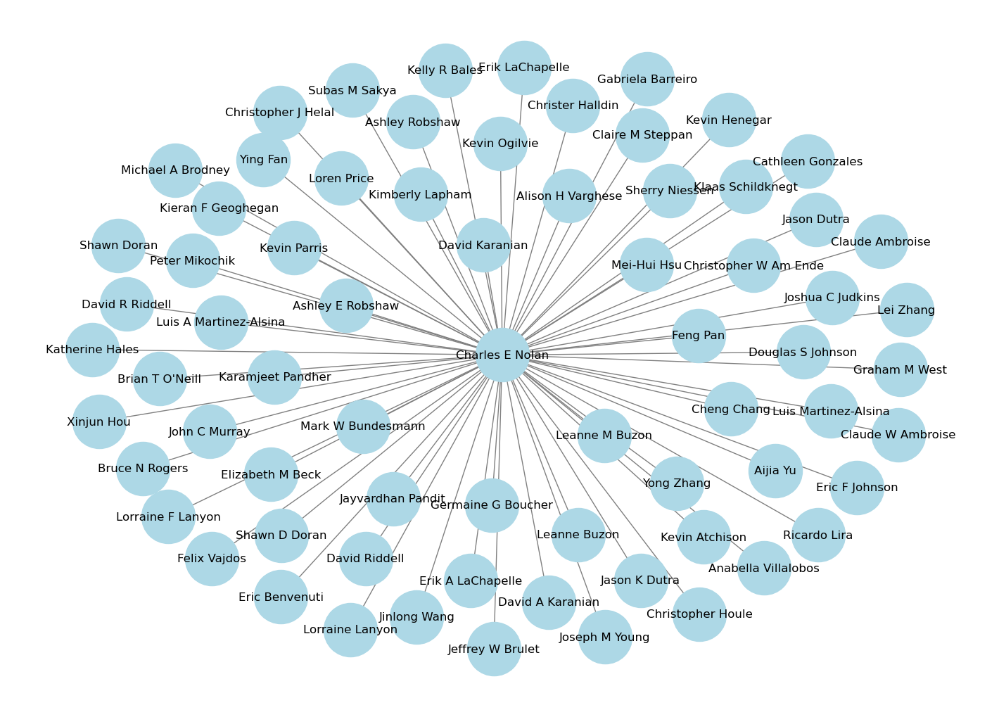

,Author,Collaborator
0,Charles E Nolan,Feng Pan
1,Charles E Nolan,Felix Vajdos
2,Charles E Nolan,Kevin Parris
3,Charles E Nolan,Alison H Varghese
4,Charles E Nolan,Christopher J Helal
...,...,...
108,Charles E Nolan,Michael A Brodney
109,Charles E Nolan,Brian T O'Neill
110,Charles E Nolan,Anabella Villalobos
111,Charles E Nolan,Lei Zhang



Author: Dean Hickman


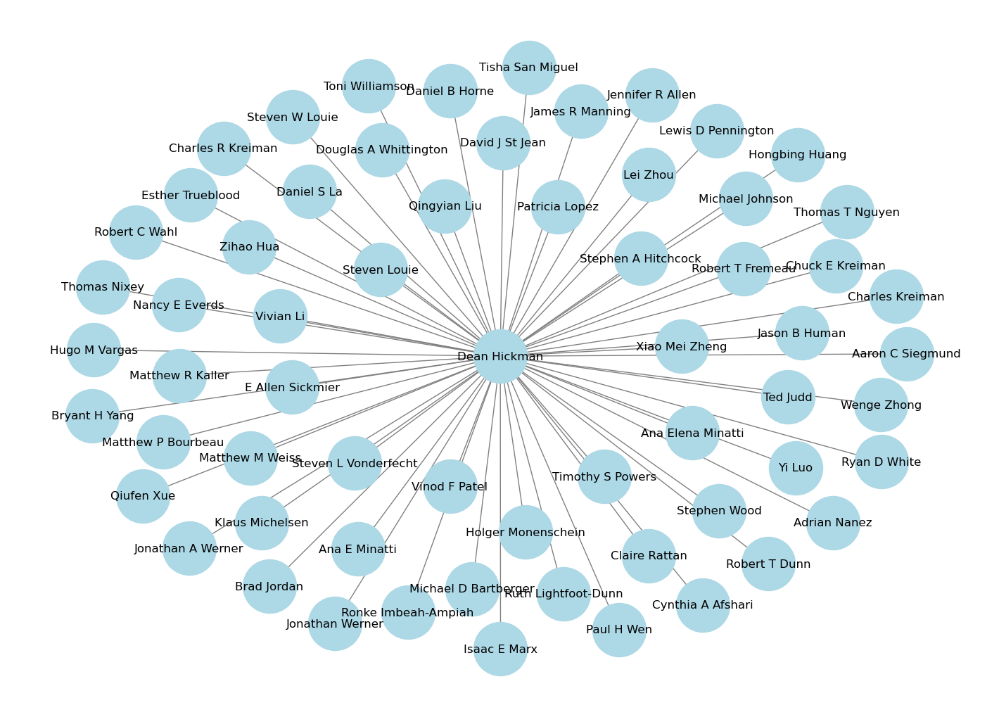

,Author,Collaborator
0,Dean Hickman,Stephen A Hitchcock
1,Dean Hickman,Brad Jordan
2,Dean Hickman,Vivian Li
3,Dean Hickman,Patricia Lopez
4,Dean Hickman,Steven W Louie
...,...,...
132,Dean Hickman,Paul H Wen
133,Dean Hickman,Michael D Bartberger
134,Dean Hickman,Douglas A Whittington
135,Dean Hickman,Jennifer R Allen



Author: Elizabeth M Beck


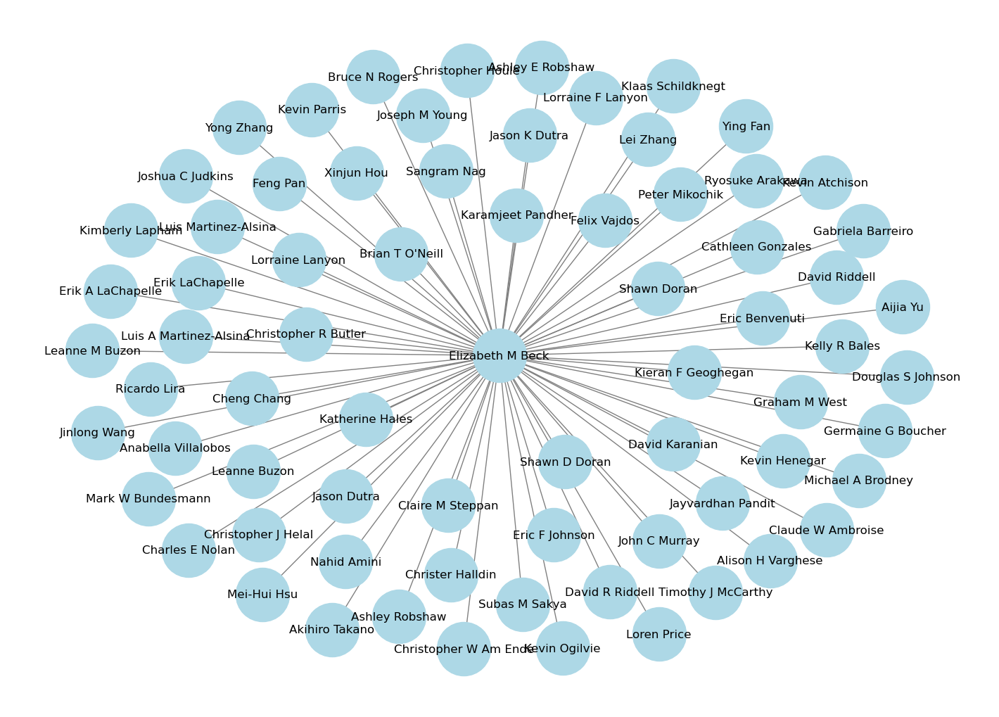

,Author,Collaborator
0,Elizabeth M Beck,Gabriela Barreiro
1,Elizabeth M Beck,Charles E Nolan
2,Elizabeth M Beck,Feng Pan
3,Elizabeth M Beck,Felix Vajdos
4,Elizabeth M Beck,Kevin Parris
...,...,...
118,Elizabeth M Beck,Claude W Ambroise
119,Elizabeth M Beck,David Karanian
120,Elizabeth M Beck,David Riddell
121,Elizabeth M Beck,Kelly R Bales



Author: James Brown


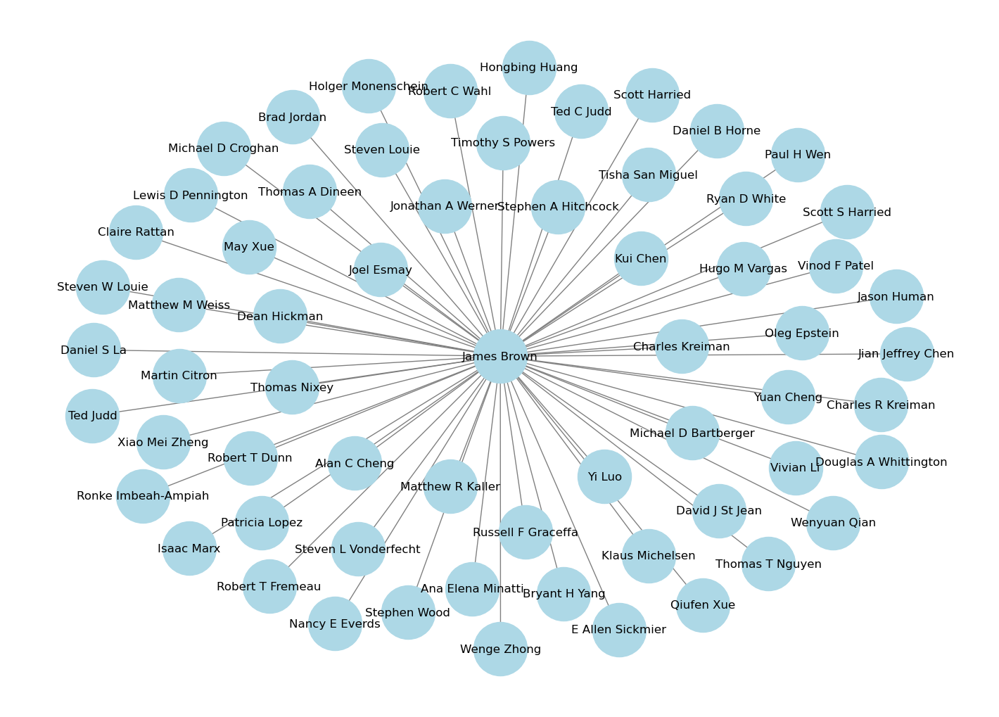

,Author,Collaborator
0,James Brown,Kui Chen
1,James Brown,Robert T Fremeau
2,James Brown,Dean Hickman
3,James Brown,Stephen A Hitchcock
4,James Brown,Brad Jordan
...,...,...
130,James Brown,Paul H Wen
131,James Brown,Ryan D White
132,James Brown,Douglas A Whittington
133,James Brown,Xiao Mei Zheng



Author: Kui Chen


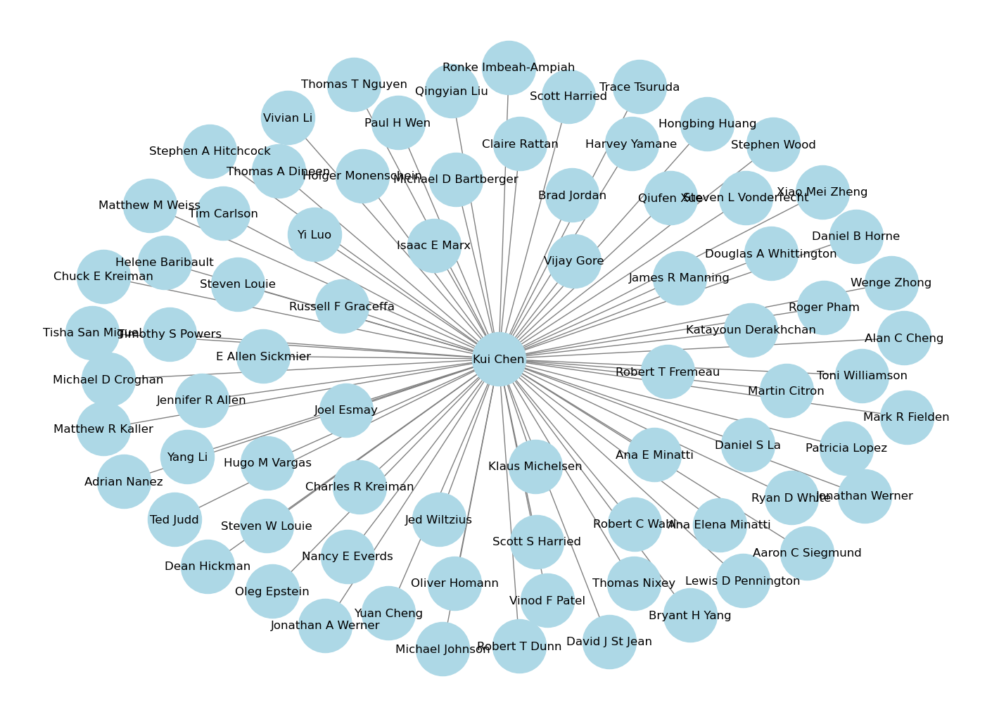

,Author,Collaborator
0,Kui Chen,Robert T Fremeau
1,Kui Chen,Dean Hickman
2,Kui Chen,Stephen A Hitchcock
3,Kui Chen,Brad Jordan
4,Kui Chen,Vivian Li
...,...,...
167,Kui Chen,Aaron C Siegmund
168,Kui Chen,Paul H Wen
169,Kui Chen,Douglas A Whittington
170,Kui Chen,Jennifer R Allen



Author: Matthew M Weiss


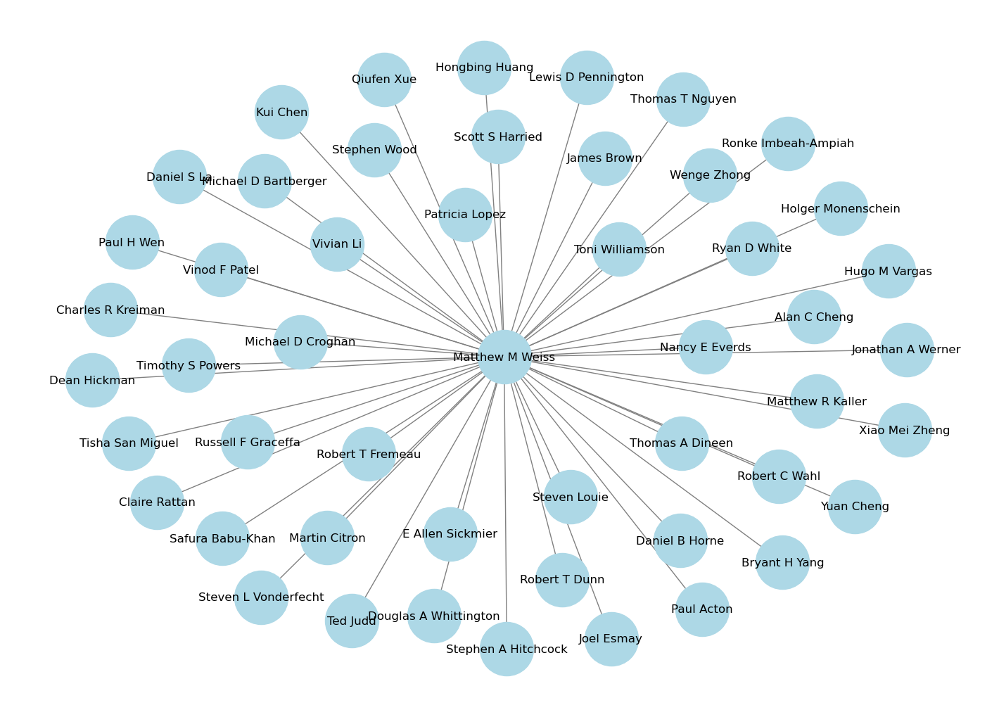

,Author,Collaborator
0,Matthew M Weiss,Toni Williamson
1,Matthew M Weiss,Safura Babu-Khan
2,Matthew M Weiss,Michael D Bartberger
3,Matthew M Weiss,James Brown
4,Matthew M Weiss,Kui Chen
...,...,...
111,Matthew M Weiss,Paul H Wen
112,Matthew M Weiss,Ryan D White
113,Matthew M Weiss,Douglas A Whittington
114,Matthew M Weiss,Xiao Mei Zheng



Author: Michael D Bartberger


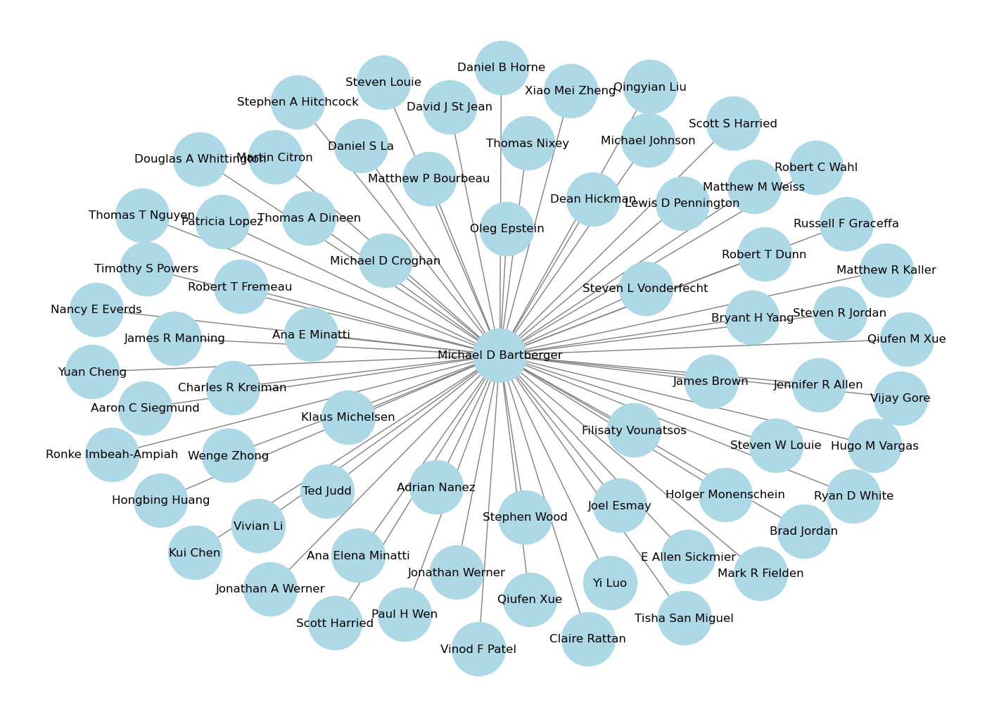

,Author,Collaborator
0,Michael D Bartberger,James Brown
1,Michael D Bartberger,Kui Chen
2,Michael D Bartberger,Robert T Fremeau
3,Michael D Bartberger,Dean Hickman
4,Michael D Bartberger,Stephen A Hitchcock
...,...,...
151,Michael D Bartberger,Jennifer R Allen
152,Michael D Bartberger,Stephen Wood
153,Michael D Bartberger,Douglas A Whittington
154,Michael D Bartberger,Jennifer R Allen



Author: Michael S Malamas


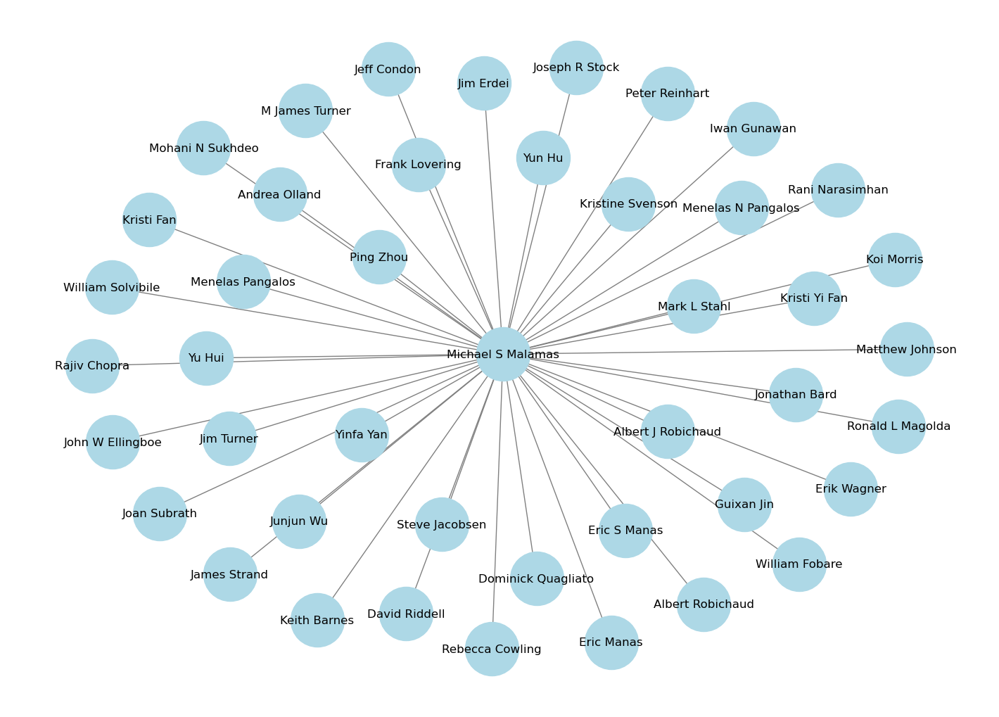

,Author,Collaborator
0,Michael S Malamas,Mark L Stahl
1,Michael S Malamas,James Strand
2,Michael S Malamas,Mohani N Sukhdeo
3,Michael S Malamas,Kristine Svenson
4,Michael S Malamas,M James Turner
...,...,...
108,Michael S Malamas,Jim Turner
109,Michael S Malamas,Kristi Yi Fan
110,Michael S Malamas,Rajiv Chopra
111,Michael S Malamas,Jonathan Bard



Author: Takahiko Yamamoto


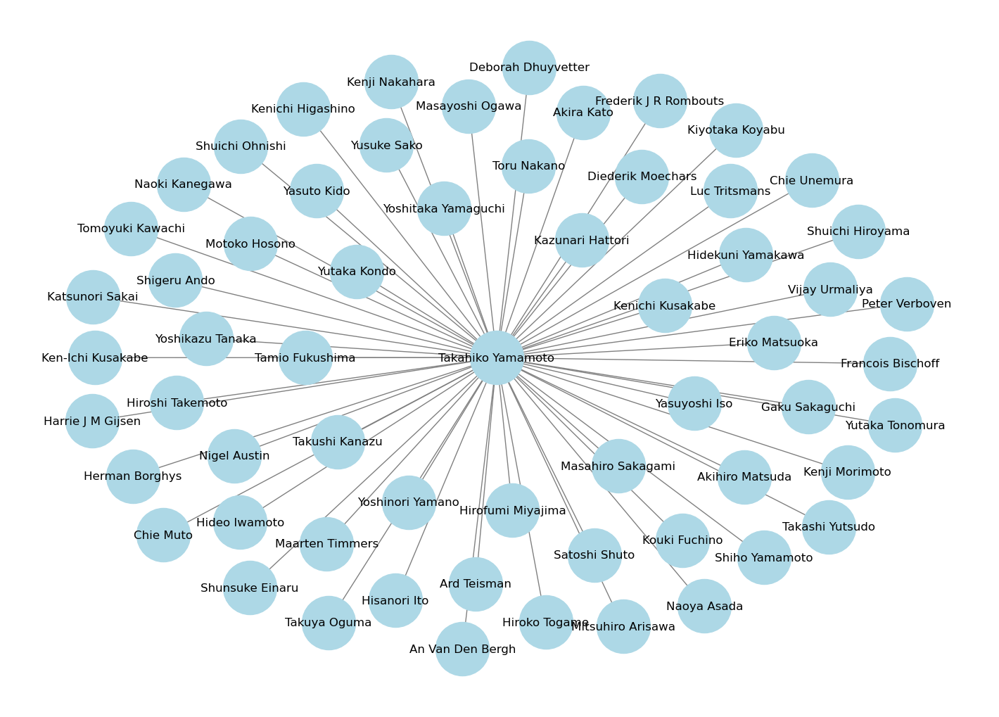

,Author,Collaborator
0,Takahiko Yamamoto,Hidekuni Yamakawa
1,Takahiko Yamamoto,Chie Muto
2,Takahiko Yamamoto,Motoko Hosono
3,Takahiko Yamamoto,Kazunari Hattori
4,Takahiko Yamamoto,Kenichi Higashino
...,...,...
131,Takahiko Yamamoto,Ken-Ichi Kusakabe
132,Takahiko Yamamoto,Shiho Yamamoto
133,Takahiko Yamamoto,Hisanori Ito
134,Takahiko Yamamoto,Yasuto Kido



Author: Thomas A Dineen


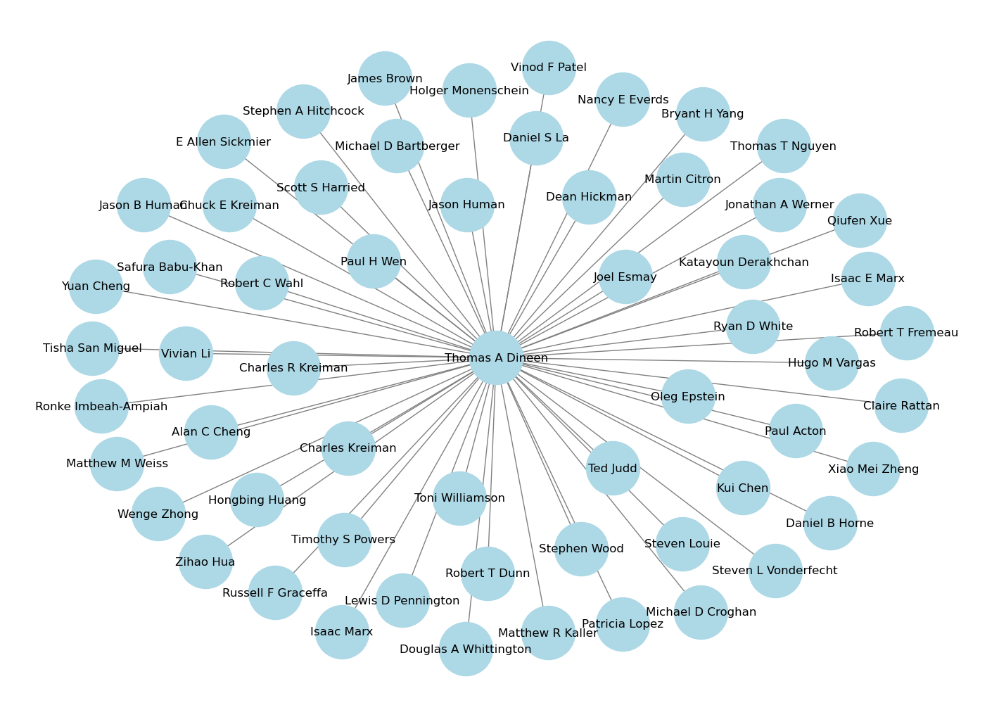

,Author,Collaborator
0,Thomas A Dineen,Joel Esmay
1,Thomas A Dineen,Russell F Graceffa
2,Thomas A Dineen,Scott S Harried
3,Thomas A Dineen,Dean Hickman
4,Thomas A Dineen,Stephen A Hitchcock
...,...,...
122,Thomas A Dineen,Robert T Dunn
123,Thomas A Dineen,Stephen Wood
124,Thomas A Dineen,Robert T Fremeau
125,Thomas A Dineen,Ryan D White



Author: Xia Chen


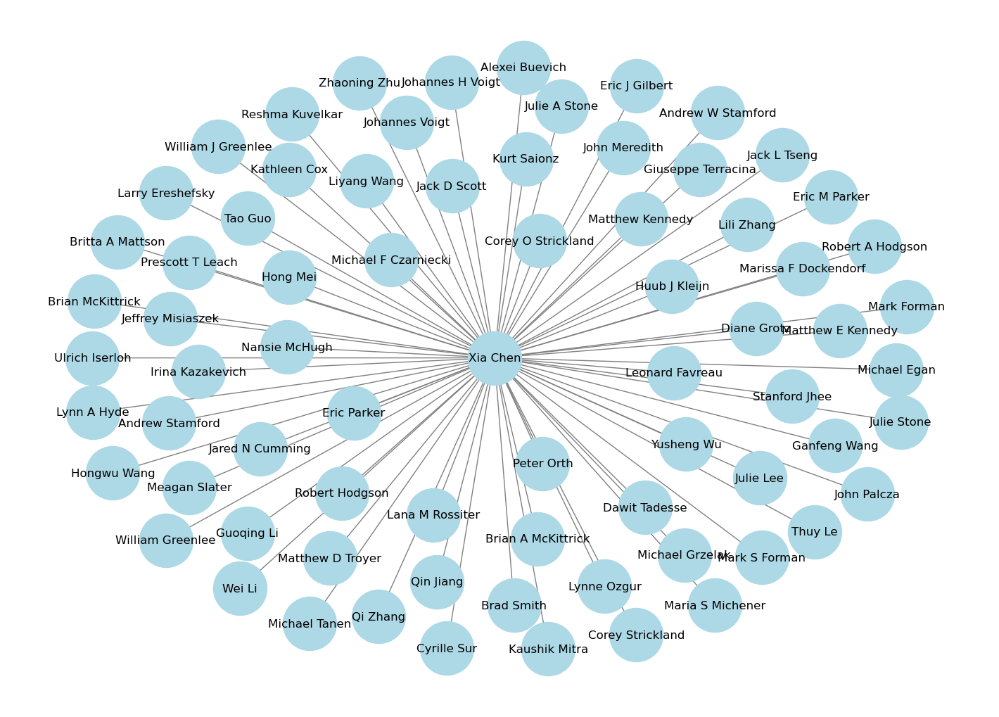

,Author,Collaborator
0,Xia Chen,Leonard Favreau
1,Xia Chen,William Greenlee
2,Xia Chen,Tao Guo
3,Xia Chen,Matthew Kennedy
4,Xia Chen,Reshma Kuvelkar
...,...,...
127,Xia Chen,Matthew E Kennedy
128,Xia Chen,Andrew W Stamford
129,Xia Chen,Cyrille Sur
130,Xia Chen,Eric M Parker



Author: Yuan Cheng


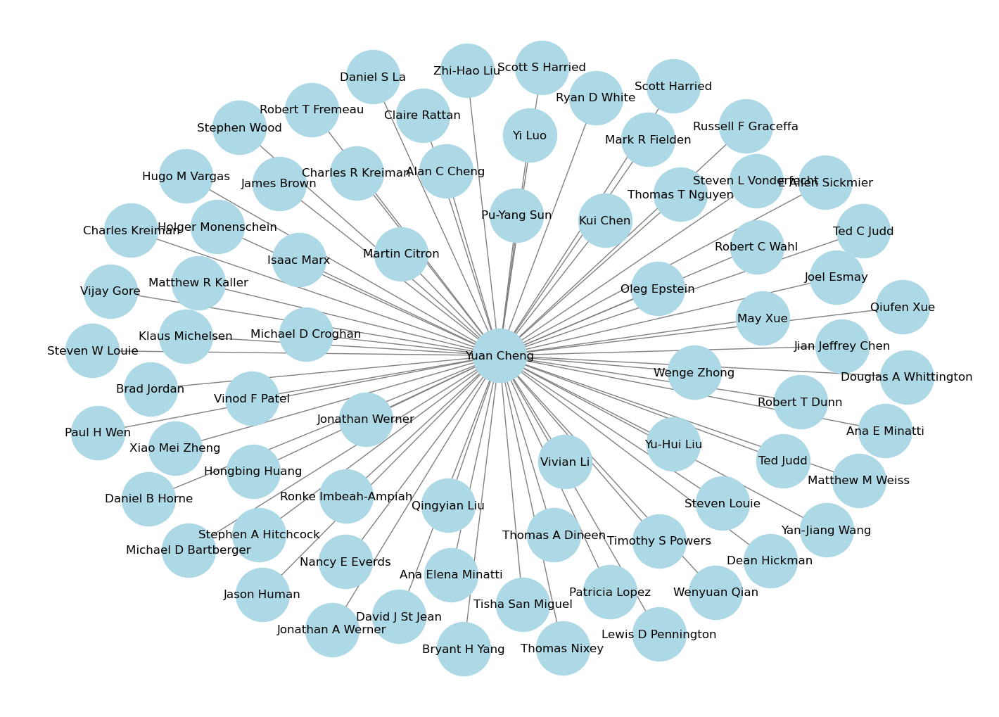

,Author,Collaborator
0,Yuan Cheng,Ted C Judd
1,Yuan Cheng,Michael D Bartberger
2,Yuan Cheng,James Brown
3,Yuan Cheng,Kui Chen
4,Yuan Cheng,Robert T Fremeau
...,...,...
144,Yuan Cheng,Ana E Minatti
145,Yuan Cheng,Pu-Yang Sun
146,Yuan Cheng,Zhi-Hao Liu
147,Yuan Cheng,Yan-Jiang Wang


In [8]:
# Set the 'Author' column as the index
Authors_Indexed = pairs.set_index('Author')

# Group the data by the 'Author' column
Authors_Grouped = Authors_Indexed.groupby('Author')


for author, group in Authors_Grouped:
    if len(group) > 110:
        print(f"\nAuthor: {author}")
        group = group.reset_index()
        for i in range(len(group)):
            G.add_node(group['Author'][i])
            G.add_edge(group['Author'][i], group['Collaborator'][i])

        plt.figure(figsize=(14, 10))
        pos = nx.spring_layout(G, seed=42)  # Calculate positions for a visually appealing layout
        nx.draw(G, pos, with_labels=True, node_size=3000, node_color='lightblue', font_size=12, edge_color='gray')
        plt.show()
        display(group)
        G.clear()

In [9]:
Top_authors_published = ['Robert Vassar','Riqiang Yan','Stefan F Lichtenthaler','Weihong Song','Jae Sue Choi','Hyun Ah Jung','Yong Shen','Wanxia He','Bart De Strooper','Kaj Blennow','Christian Haass']

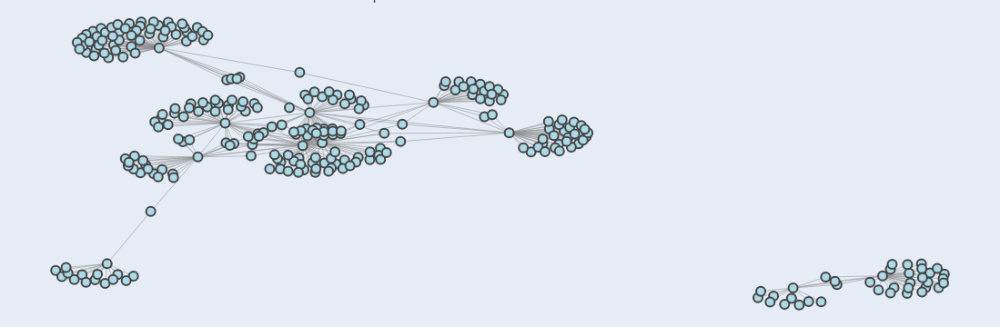

In [11]:
import plotly.graph_objects as go
import networkx as nx
import pandas as pd

# Assuming 'Authors' is your DataFrame with columns 'Author' and 'Collaborator'

# List of selected authors
selected_authors = ['Robert Vassar', 'Riqiang Yan', 'Stefan F Lichtenthaler', 'Weihong Song', 'Jae Sue Choi',
                    'Hyun Ah Jung', 'Yong Shen', 'Wanxia He', 'Bart De Strooper', 'Kaj Blennow', 'Christian Haass']

# Create an empty graph G
G = nx.Graph()

# Loop through each row in the DataFrame
for index, row in pairs.iterrows():
    author = row['Author']
    collaborator = row['Collaborator']

    # Only add nodes and edges if the author is in the selected authors list
    if author in selected_authors:
        G.add_node(author)
        G.add_node(collaborator)
        G.add_edge(author, collaborator)

# Generate positions for each node for layout
pos = nx.spring_layout(G, seed=42)

# Create edges
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Create nodes
node_x = []
node_y = []
node_text = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)
    node_text.append(node)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    text=node_text,
    marker=dict(
        showscale=False,
        color='lightblue',  # You can customize the color here
        size=10,
        line_width=2))

# Create figure
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='Selected Authors Collaboration Network Graph',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=0, l=0, r=0, t=0),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

fig.show()
fig.update_traces(textposition='top center', textfont_size=10)  # Adjust font size
fig.write_html("Collaboration Network Graph.html")

In [12]:
pairs['Author']

0           Riqiang Yan
1           Riqiang Yan
2           Riqiang Yan
3           J B Munzner
4           J B Munzner
              ...      
91541     Jian-Zhi Wang
91542     Jian-Zhi Wang
91543          Rong Liu
91544          Rong Liu
91545    Xiaochuan Wang
Name: Author, Length: 91546, dtype: object

In [13]:
Selected_Authors = pd.DataFrame({'Name':selected_authors})

# Method 1: Using merge
result_isin = pairs['Author'].isin(Selected_Authors['Name'])

print("Using merge:")
print(result_isin)

Using merge:
0         True
1         True
2         True
3        False
4        False
         ...  
91541    False
91542    False
91543    False
91544    False
91545    False
Name: Author, Length: 91546, dtype: bool


In [14]:
top_author_colab = pairs
top_author_colab['TF'] = result_isin
top_author_colab = top_author_colab[top_author_colab['TF'] == True]

top_author10 = top_author_colab.iloc[:,0:-1]

# Set the 'Author' column as the index
top_author_colab_index = top_author10.set_index('Author')

# Group the data by the 'Author' column
top_author_colab_index_group = top_author_colab_index.groupby('Author')




Author: Bart De Strooper


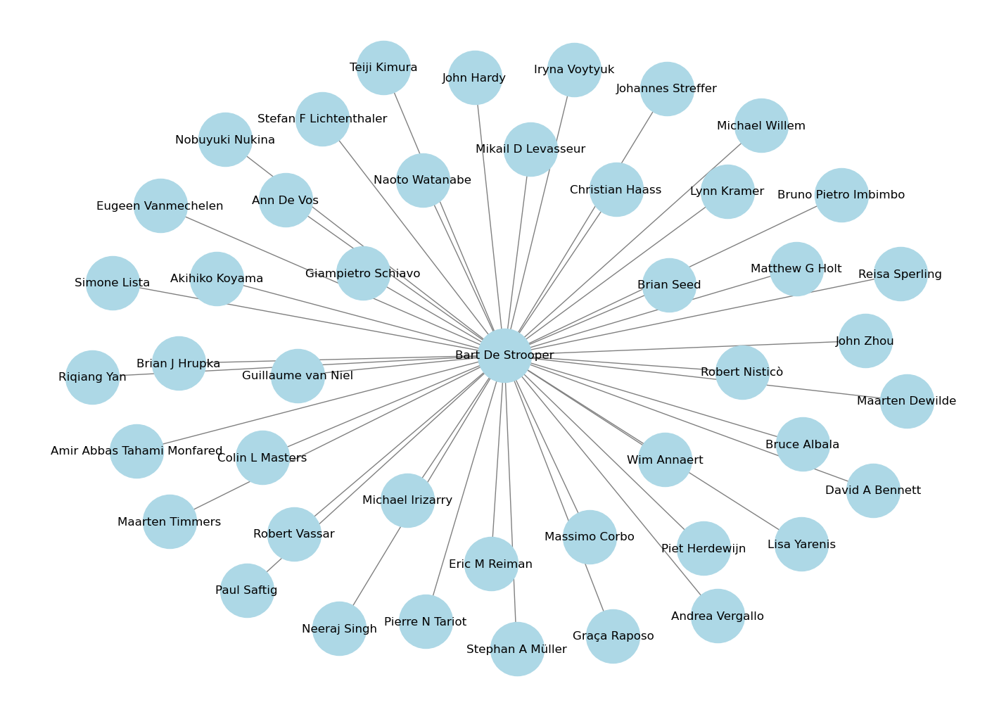

,Author,Collaborator
0,Bart De Strooper,Brian Seed
1,Bart De Strooper,Paul Saftig
2,Bart De Strooper,Nobuyuki Nukina
3,Bart De Strooper,Christian Haass
4,Bart De Strooper,Stefan F Lichtenthaler
5,Bart De Strooper,Christian Haass
6,Bart De Strooper,David A Bennett
7,Bart De Strooper,Robert Vassar
8,Bart De Strooper,Giampietro Schiavo
9,Bart De Strooper,Wim Annaert



Author: Christian Haass


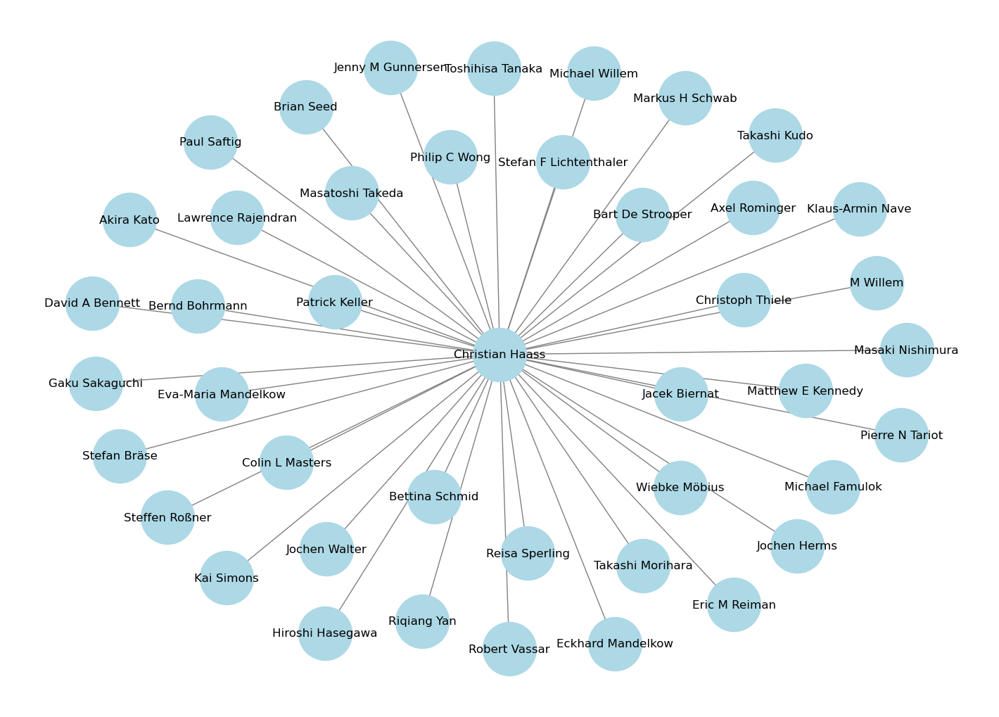

,Author,Collaborator
0,Christian Haass,Christoph Thiele
1,Christian Haass,Kai Simons
2,Christian Haass,Paul Saftig
3,Christian Haass,Bart De Strooper
4,Christian Haass,Brian Seed
5,Christian Haass,Michael Famulok
6,Christian Haass,Jochen Walter
7,Christian Haass,Patrick Keller
8,Christian Haass,Jacek Biernat
9,Christian Haass,Eckhard Mandelkow



Author: Hyun Ah Jung


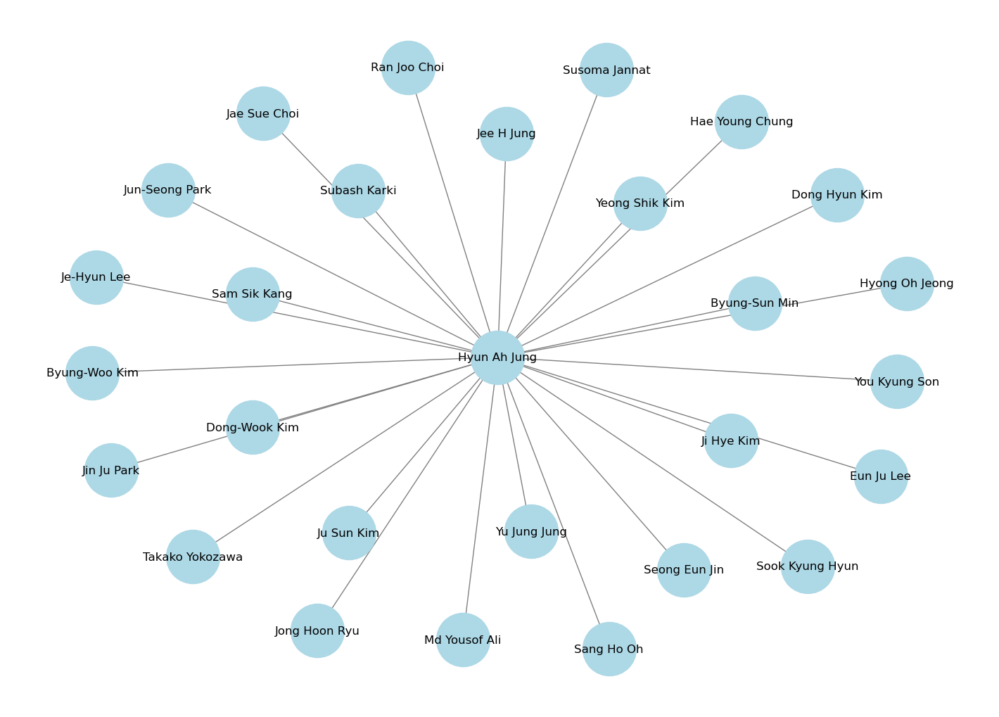

,Author,Collaborator
0,Hyun Ah Jung,Byung-Sun Min
1,Hyun Ah Jung,Takako Yokozawa
2,Hyun Ah Jung,Je-Hyun Lee
3,Hyun Ah Jung,Yeong Shik Kim
4,Hyun Ah Jung,Jae Sue Choi
5,Hyun Ah Jung,Eun Ju Lee
6,Hyun Ah Jung,Ju Sun Kim
7,Hyun Ah Jung,Sam Sik Kang
8,Hyun Ah Jung,Je-Hyun Lee
9,Hyun Ah Jung,Byung-Sun Min



Author: Jae Sue Choi


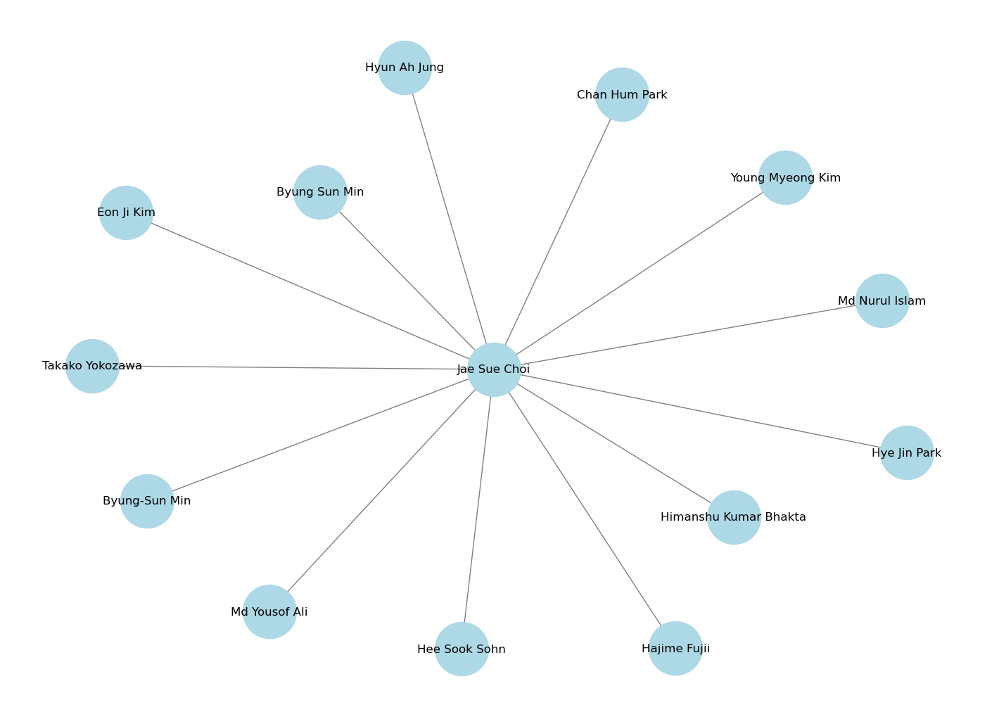

,Author,Collaborator
0,Jae Sue Choi,Md Nurul Islam
1,Jae Sue Choi,Md Yousof Ali
2,Jae Sue Choi,Eon Ji Kim
3,Jae Sue Choi,Young Myeong Kim
4,Jae Sue Choi,Hyun Ah Jung
5,Jae Sue Choi,Md Nurul Islam
6,Jae Sue Choi,Md Yousof Ali
7,Jae Sue Choi,Young Myeong Kim
8,Jae Sue Choi,Hye Jin Park
9,Jae Sue Choi,Hee Sook Sohn



Author: Kaj Blennow


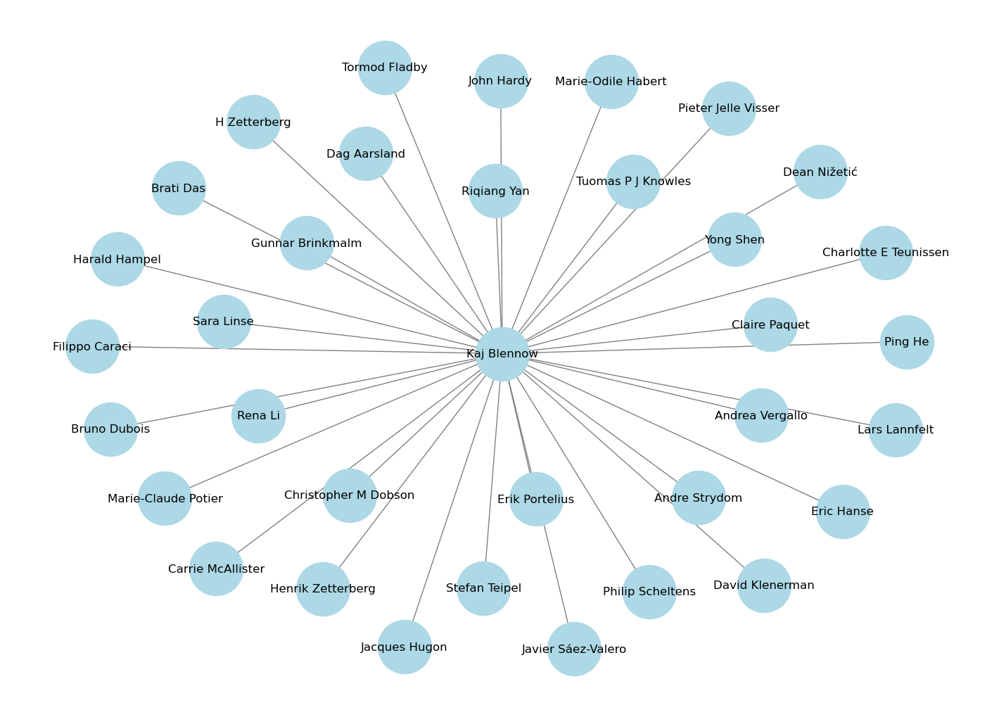

,Author,Collaborator
0,Kaj Blennow,Ping He
1,Kaj Blennow,Carrie McAllister
2,Kaj Blennow,Harald Hampel
3,Kaj Blennow,Yong Shen
4,Kaj Blennow,H Zetterberg
5,Kaj Blennow,Eric Hanse
6,Kaj Blennow,Henrik Zetterberg
7,Kaj Blennow,Rena Li
8,Kaj Blennow,Yong Shen
9,Kaj Blennow,Erik Portelius



Author: Riqiang Yan


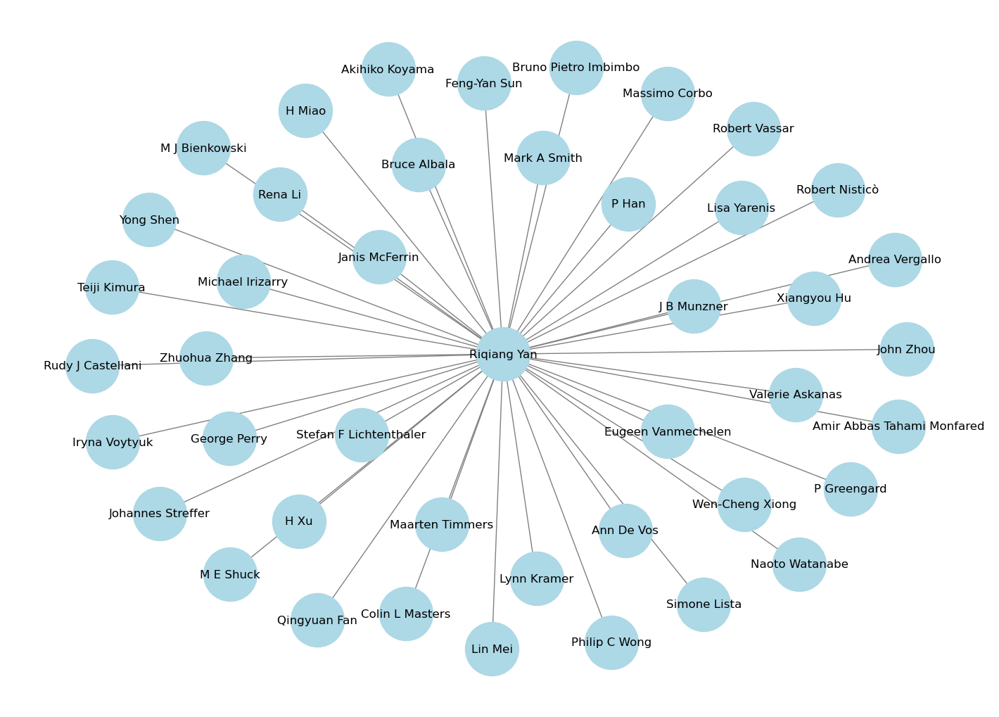

,Author,Collaborator
0,Riqiang Yan,J B Munzner
1,Riqiang Yan,M E Shuck
2,Riqiang Yan,M J Bienkowski
3,Riqiang Yan,P Han
4,Riqiang Yan,H Miao
5,Riqiang Yan,P Greengard
6,Riqiang Yan,H Xu
7,Riqiang Yan,Janis McFerrin
8,Riqiang Yan,Valerie Askanas
9,Riqiang Yan,Philip C Wong



Author: Robert Vassar


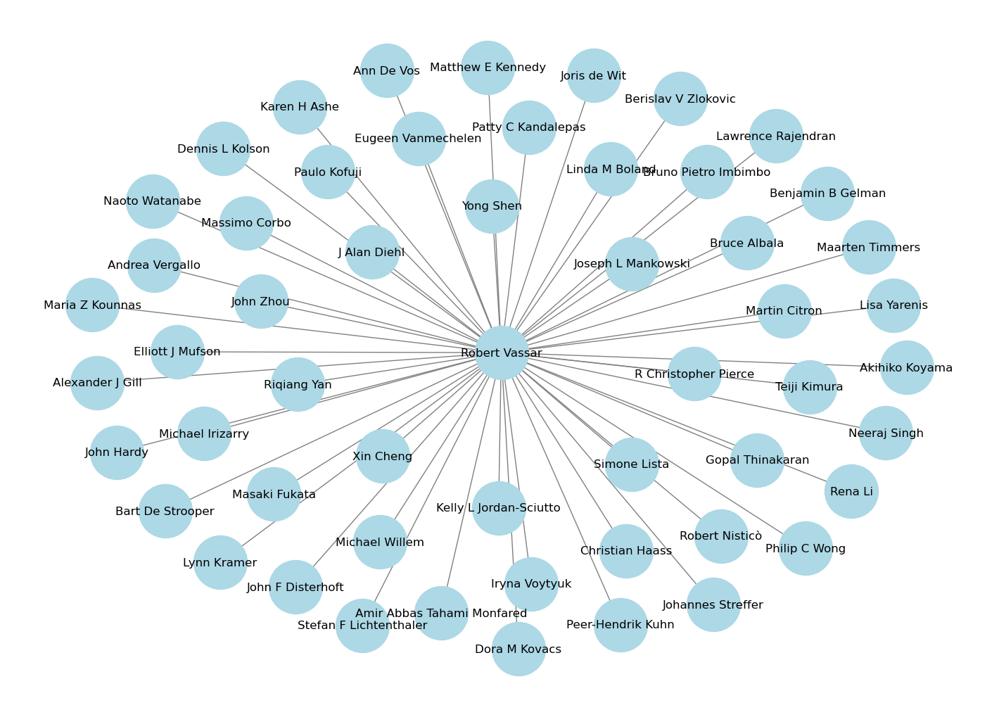

,Author,Collaborator
0,Robert Vassar,Martin Citron
1,Robert Vassar,John F Disterhoft
2,Robert Vassar,John F Disterhoft
3,Robert Vassar,Martin Citron
4,Robert Vassar,Paulo Kofuji
...,...,...
59,Robert Vassar,Andrea Vergallo
60,Robert Vassar,Stefan F Lichtenthaler
61,Robert Vassar,Xin Cheng
62,Robert Vassar,Rena Li



Author: Stefan F Lichtenthaler


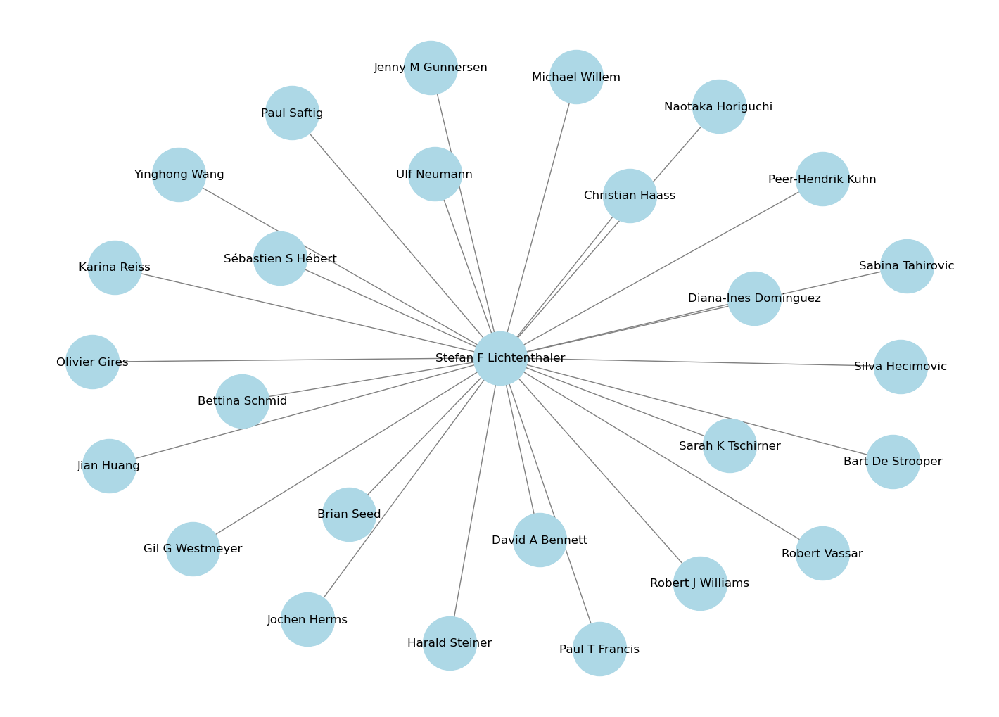

,Author,Collaborator
0,Stefan F Lichtenthaler,Diana-Ines Dominguez
1,Stefan F Lichtenthaler,Gil G Westmeyer
2,Stefan F Lichtenthaler,Karina Reiss
3,Stefan F Lichtenthaler,Christian Haass
4,Stefan F Lichtenthaler,Paul Saftig
5,Stefan F Lichtenthaler,Bart De Strooper
6,Stefan F Lichtenthaler,Brian Seed
7,Stefan F Lichtenthaler,Christian Haass
8,Stefan F Lichtenthaler,Sébastien S Hébert
9,Stefan F Lichtenthaler,Bart De Strooper



Author: Wanxia He


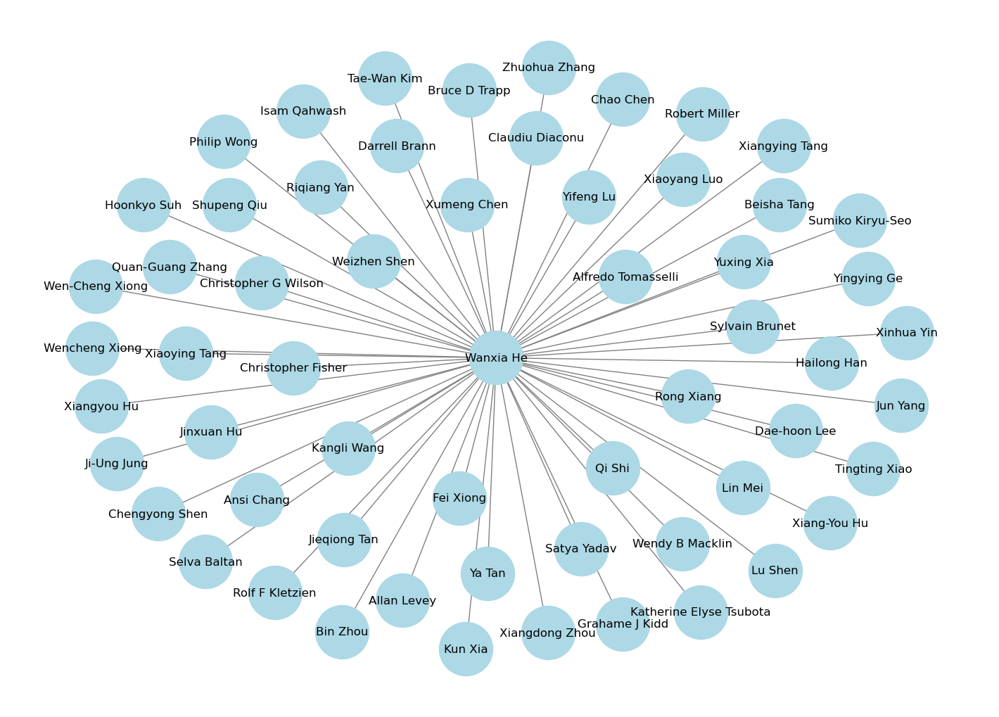

,Author,Collaborator
0,Wanxia He,Alfredo Tomasselli
1,Wanxia He,Rolf F Kletzien
2,Wanxia He,Riqiang Yan
3,Wanxia He,Yifeng Lu
4,Wanxia He,Isam Qahwash
...,...,...
100,Wanxia He,Riqiang Yan
101,Wanxia He,Riqiang Yan
102,Wanxia He,Xiangyou Hu
103,Wanxia He,Riqiang Yan



Author: Weihong Song


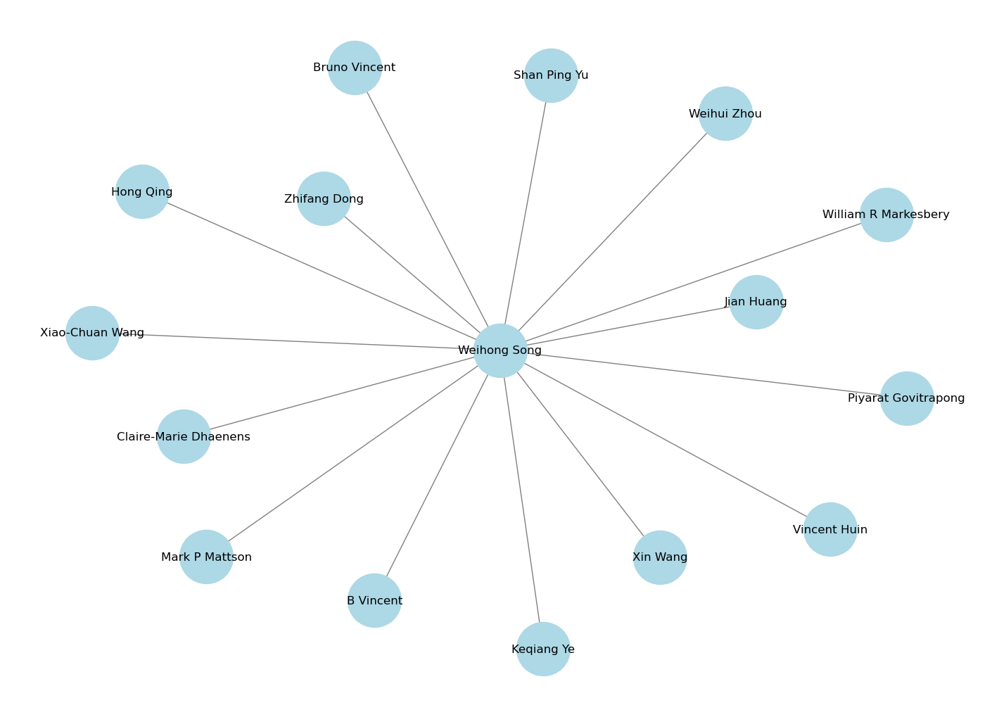

,Author,Collaborator
0,Weihong Song,William R Markesbery
1,Weihong Song,Mark P Mattson
2,Weihong Song,Hong Qing
3,Weihong Song,Weihui Zhou
4,Weihong Song,Bruno Vincent
5,Weihong Song,Piyarat Govitrapong
6,Weihong Song,B Vincent
7,Weihong Song,Zhifang Dong
8,Weihong Song,Jian Huang
9,Weihong Song,Vincent Huin



Author: Yong Shen


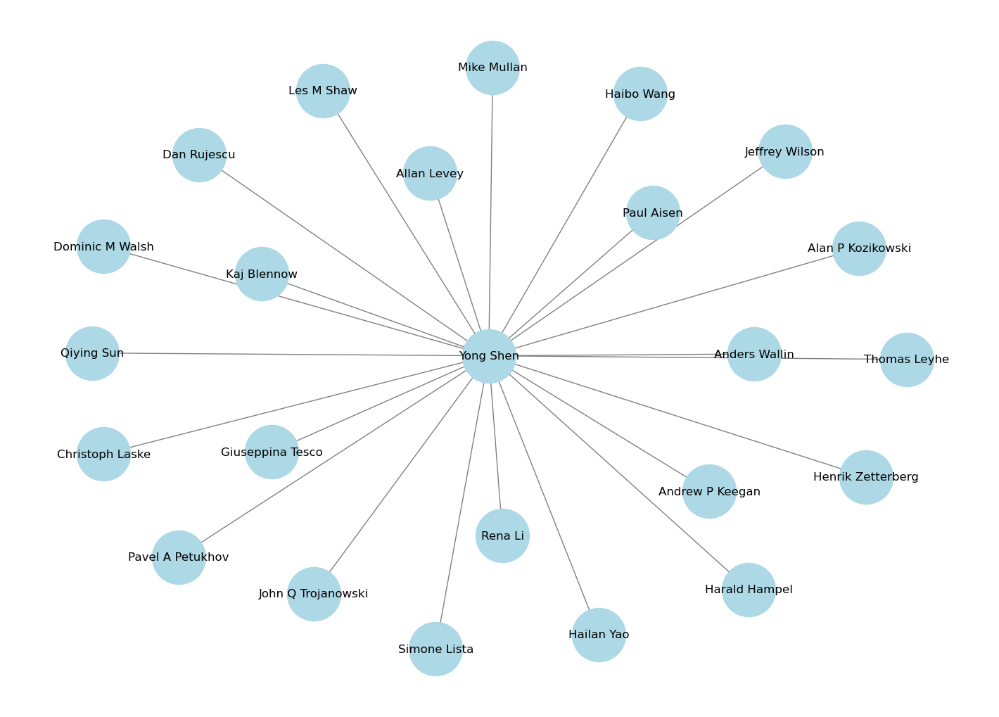

,Author,Collaborator
0,Yong Shen,Alan P Kozikowski
1,Yong Shen,Pavel A Petukhov
2,Yong Shen,Dominic M Walsh
3,Yong Shen,Paul Aisen
4,Yong Shen,Les M Shaw
5,Yong Shen,Henrik Zetterberg
6,Yong Shen,John Q Trojanowski
7,Yong Shen,Kaj Blennow
8,Yong Shen,Rena Li
9,Yong Shen,Harald Hampel


In [15]:
G.clear()
for Author, group_new in top_author_colab_index_group:
    print(f"\nAuthor: {Author}")
    group_new = group_new.reset_index()
    for i in range(len(group_new)):
        G.add_node(group_new['Author'][i])
        G.add_edge(group_new['Author'][i], group_new['Collaborator'][i])

    plt.figure(figsize=(14, 10))
    pos = nx.spring_layout(G, seed=42)  # Calculate positions for a visually appealing layout
    nx.draw(G, pos, with_labels=True, node_size=3000, node_color='lightblue', font_size=12, edge_color='gray')
    plt.show()
    display(group_new)
    G.clear()

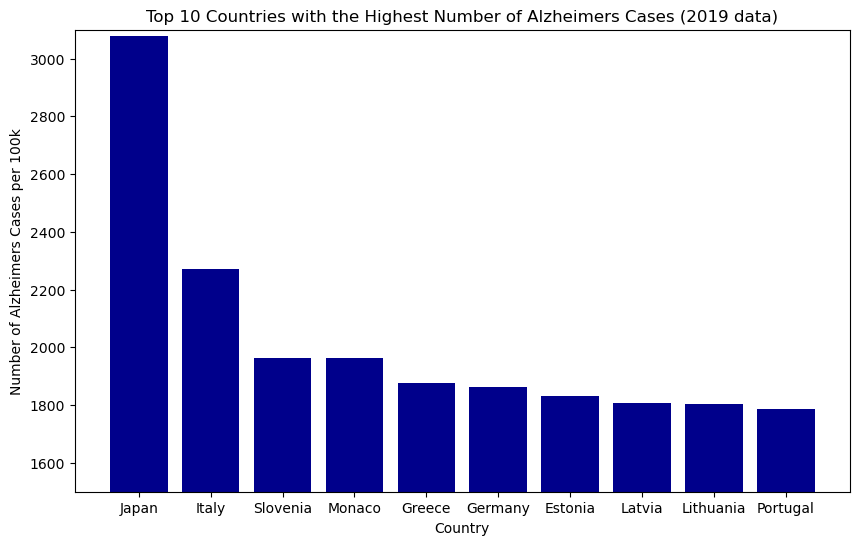

In [16]:
# Read the Excel file into a DataFrame
Alzheimers = pd.read_excel(r"C:\Users\hiraj\Downloads\Group 7\Alzheimer's cases top countries 2016.xlsx")

# Sort the DataFrame by the 'Cases' column in descending order
Alzheimers_sorted = Alzheimers.sort_values(by='Prevalent_Cases', ascending=False)

# Select the top 10 countries
top_10_countries = Alzheimers_sorted.head(10)

# Plot the bar chart
plt.figure(figsize=(10, 6))
plt.bar(top_10_countries['Country'], top_10_countries['Prevalent_Cases'], color='darkblue')
plt.xlabel('Country')
plt.ylabel('Number of Alzheimers Cases per 100k')
plt.title('Top 10 Countries with the Highest Number of Alzheimers Cases (2019 data)')
#plt.xticks(rotation=45, ha='right')  # Rotate country names for better visibility
plt.ylim(1500, 3100)
plt.show()

In [17]:
Alzheimers

,Country,Prevalent_Cases
0,Japan,3079
1,Italy,2270
2,Monaco,1962
3,Slovenia,1963
4,Greece,1875
...,...,...
198,Chad,113
199,Niger,106
200,Somalia,100
201,Qatar,94


In [18]:
import plotly.express as px
import plotly.io as pio
# plot the countries ("Entity" column) by country name, for each electricity column in turn
fig = px.choropleth(Alzheimers,locations="Country",locationmode="country names",color="Prevalent_Cases",color_continuous_scale=px.colors.sequential.Blues)

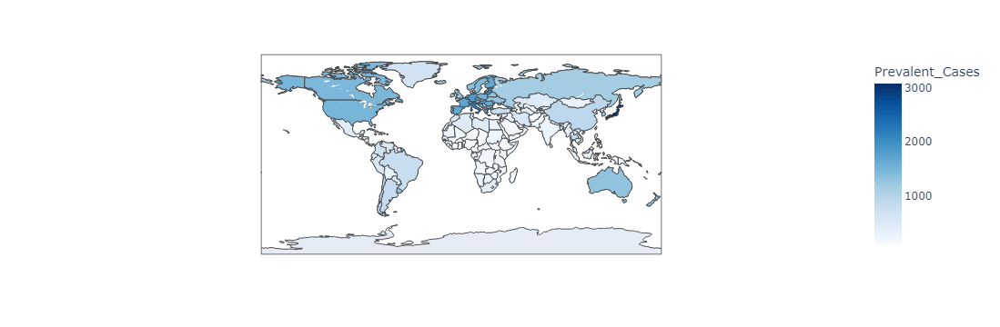

In [19]:
fig

In [20]:
fig.write_html("Alzheimers_choropleth_2019.html")

In [21]:
articles = pd.read_csv(r"C:\Users\hiraj\Downloads\Group 7\articles.BACE1.csv")

In [22]:
articles
affiliation = pd.DataFrame()
split = pd.DataFrame()
affiliation['Address'] = articles['FirstAuthorAffiliation']

In [23]:
affiliation

,Address
0,"Department of Cell and Molecular Biology, Phar..."
1,"Department of Psychiatry (B8134), Washington U..."
2,"Department of Cell & Molecular Biology, Pharma..."
3,Neurology Centre of Excellence for Drug Discov...
4,"Glyco-chain Functions Laboratory, Supra-biomol..."
...,...
2297,Fujian Key Laboratory of Translational Researc...
2298,Department of Medicine and Biomedical Research...
2299,"Department of Neurology, Jiangsu Traditional C..."
2300,"Central Laboratory, Xuanwu Hospital, Capital M..."


In [24]:
#split = affiliation["Address"].str.split(","".", expand = True)
split = affiliation['Address'].str.extract(r',([^,]+)$', expand=False)
#split = split.dropna(axis=0, how='all')
#empty_columns = split.columns[split.isna().all()]
#split = split.drop(columns=empty_columns)
affiliation['Country'] = split
print(affiliation)

                                                Address  \
0     Department of Cell and Molecular Biology, Phar...   
1     Department of Psychiatry (B8134), Washington U...   
2     Department of Cell & Molecular Biology, Pharma...   
3     Neurology Centre of Excellence for Drug Discov...   
4     Glyco-chain Functions Laboratory, Supra-biomol...   
...                                                 ...   
2297  Fujian Key Laboratory of Translational Researc...   
2298  Department of Medicine and Biomedical Research...   
2299  Department of Neurology, Jiangsu Traditional C...   
2300  Central Laboratory, Xuanwu Hospital, Capital M...   
2301  School of Basic Medicine, Key Laboratory of Ed...   

                       Country  
0      USA. ryan@pharmacia.com  
1                         USA.  
2      USA. ryan@pharmacia.com  
3              United Kingdom.  
4                       Japan.  
...                        ...  
2297                    China.  
2298                      U

In [25]:
a1 = affiliation['Country'].str.split('.', expand = True)
a1 = a1.iloc[:, :1]
print(a1)
Country = pd.DataFrame()
Country['Country'] = a1

                    0
0                 USA
1                 USA
2                 USA
3      United Kingdom
4               Japan
...               ...
2297            China
2298              USA
2299         PR China
2300         PR China
2301            China

[2302 rows x 1 columns]


In [26]:
Country

,Country
0,USA
1,USA
2,USA
3,United Kingdom
4,Japan
...,...
2297,China
2298,USA
2299,PR China
2300,PR China


In [27]:
Country['Country'] = Country['Country'].str.replace(' ', '')
Country = Country.dropna()

In [28]:
Country

,Country
0,USA
1,USA
2,USA
3,UnitedKingdom
4,Japan
...,...
2297,China
2298,USA
2299,PRChina
2300,PRChina


In [29]:
#Country['Country'] = Country['Country'].str.replace("'", '')
#Country = Country.replace(['UnitedKingdom'],['UK']).replace(['RepublicofKorea'],['Korea']).replace(['UnitedStates'],['USA']).replace(['SouthKorea'],['Korea']).replace(['P'],['China']).replace(['PRChina'],['China']).replace(['Peopleâ€™sRepublicofChina'],['China']).replace(['UnitedStatesofAmerica'],['USA']).replace(['RepublicofIreland'],['Ireland']).replace(['TheNetherlands'],['Netherlands']).replace(['NorthernIreland'],['UK']).replace(['U'],['USA']).replace(['ROC'],['China']).replace(['CzechRepublic'],['Czech Republic']).replace(['SouthAfrica'],['South Africa']).replace(['MÃ©xico'],['Mexico']).replace(['SaudiArabia'],['Saudi Arabia']).replace(['KingdomofSaudiArabia'],['Saudi Arabia']).replace(['PeoplesRepublicofChina'],['China']).replace(['Peopleâ€™sRepublicofChina'],['China'])

In [30]:
#Exporting file changes
#filepath = Path(r"C:\Users\hiraj\Downloads\Group 7\Country.csv")  
#filepath.parent.mkdir(parents=True, exist_ok=True)  
#Country.to_csv(filepath, index=False)  

In [31]:
#Importing the corrected files
Country_names = pd.read_csv(r"C:\Users\hiraj\Downloads\Group 7\Country_1.csv")

In [32]:
c2 = pd.DataFrame()
c2 = Country_names.value_counts().reset_index()

In [33]:
c2

,Country,count
0,USA,572
1,China,492
2,Japan,124
3,Korea,123
4,Germany,120
5,Italy,81
6,India,81
7,UK,75
8,Canada,56
9,Australia,49


In [34]:
fig1 = px.choropleth(c2,locations="Country",locationmode="country names",color="count", color_continuous_scale=px.colors.sequential.YlGnBu)

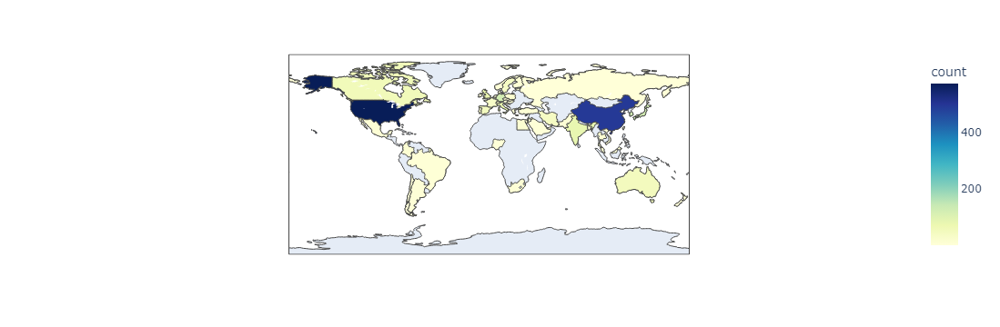

In [35]:
fig1.show()
fig1.write_html("PaperCount_Choropleth.html")

In [36]:
Country_names_top10 = c2.head(10)
fig2 = px.bar(Country_names_top10, x="Country", y="count", title="Bar Chart")

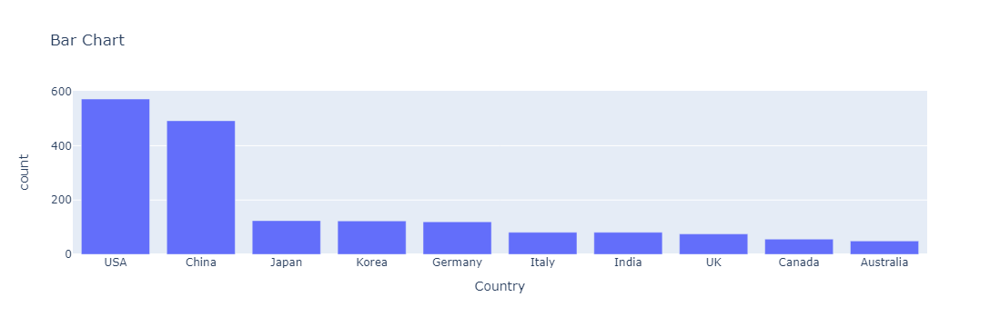

In [37]:
fig2.show()

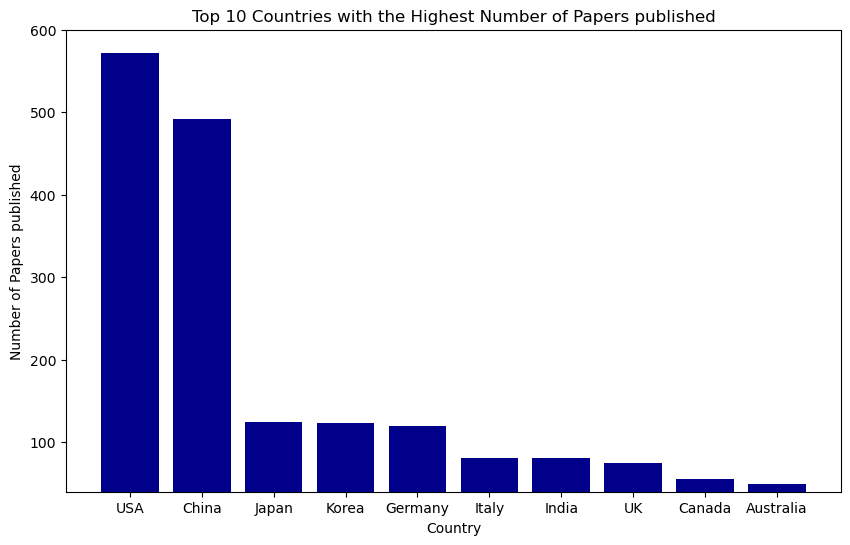

In [38]:
plt.figure(figsize=(10, 6))
plt.bar(Country_names_top10['Country'], Country_names_top10['count'], color='darkblue')
plt.xlabel('Country')
plt.ylabel('Number of Papers published')
plt.title('Top 10 Countries with the Highest Number of Papers published')
#plt.xticks(rotation=45, ha='right')  # Rotate country names for better visibility
plt.ylim(40, 600)
plt.show()